<a href="https://colab.research.google.com/github/nagarjunakki02/Thesis-on-Image-analysis-of-biomedical-data/blob/main/Thesis_on_Image_analysis_of_biomedical_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Installing and Importing necessary libraries

In [2]:
pip install opencv-python

In [3]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

In [4]:
img = cv.imread('/content/drive/MyDrive/Thesis/PROF images/Aufnahme-161029-0017.jpg',0)
print(img.shape)

(1920, 2560)


# Converting Image to Histogram

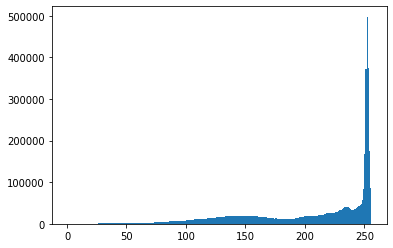

In [5]:
plt.hist(img.ravel(),256,[0,256]); plt.show()

# Intensity of Image distributed into R G B channels

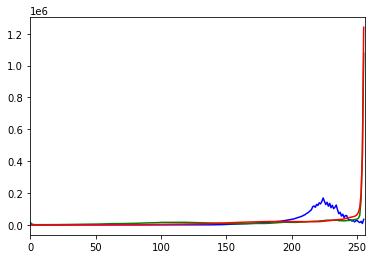

In [6]:
img = cv.imread('/content/drive/MyDrive/Thesis/PROF images/Aufnahme-161029-0017.jpg')
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv.calcHist([img],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

In [7]:
from skimage import io
import matplotlib.pyplot as plt

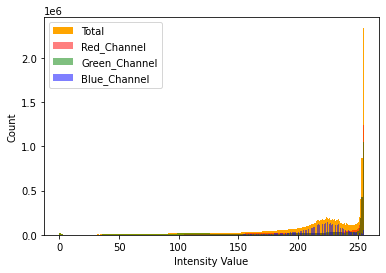

In [8]:
image = io.imread('/content/drive/MyDrive/Thesis/PROF images/Aufnahme-161029-0017.jpg')
plt.hist(image.ravel(), bins = 256, color = 'orange', )
plt.hist(image[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
plt.hist(image[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
plt.hist(image[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
plt.xlabel('Intensity Value')
plt.ylabel('Count')
plt.legend(['Total', 'Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()

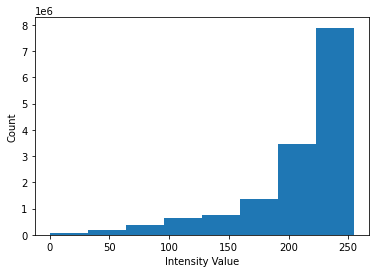

In [9]:
plt.hist(image.ravel(), bins = 8 )
plt.xlabel('Intensity Value')
plt.ylabel('Count')
plt.show()

(array([12., 10., 12., 12.,  7., 10., 12.,  7.,  9.,  9.]),
 array([0.00188972, 0.10039477, 0.19889983, 0.29740488, 0.39590994,
        0.49441499, 0.59292005, 0.6914251 , 0.78993016, 0.88843521,
        0.98694026]),
 <a list of 10 Patch objects>)

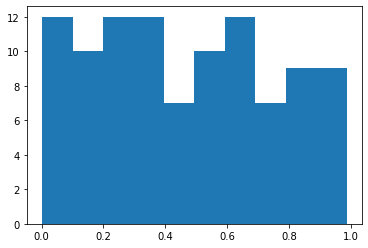

In [10]:
x = np.random.rand(100)
plt.hist(x)

# Harris Corner Detection

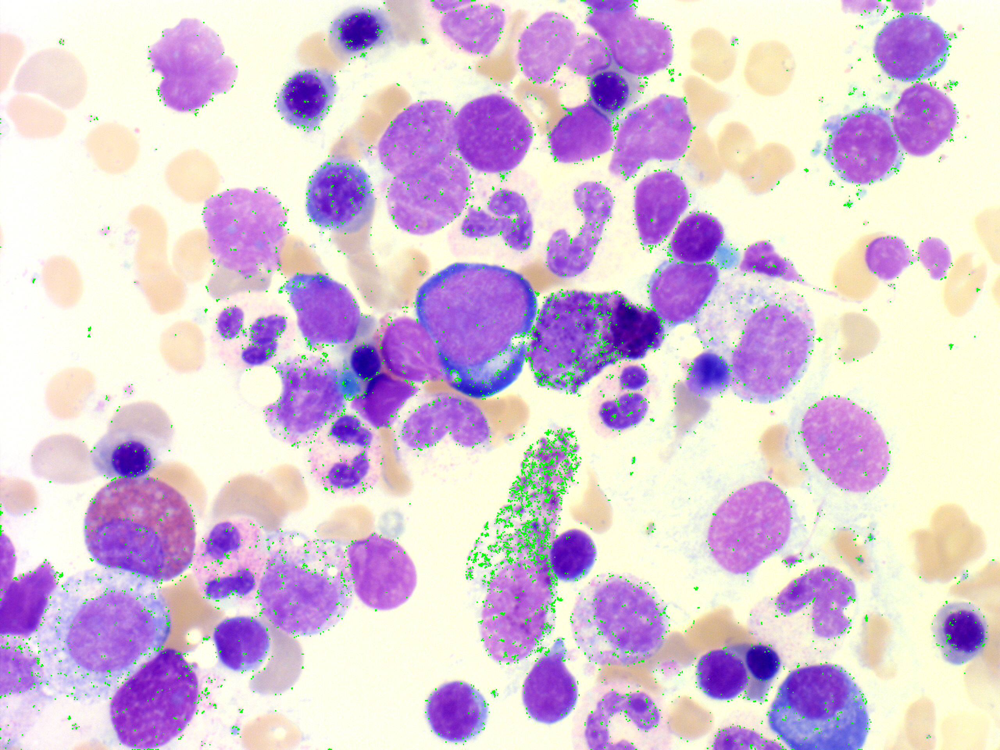

-1

In [11]:
img = cv.imread('/content/drive/MyDrive/Thesis/PROF images/Aufnahme-161029-0017.jpg')
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gray_img = np.float32(gray_img)
from google.colab.patches import cv2_imshow 

dst = cv.cornerHarris(gray_img, blockSize=2, ksize=3, k=0.04)

# dilate to mark the corners
dst = cv.dilate(dst, None)
img[dst > 0.01 * dst.max()] = [0, 255, 0]

cv2_imshow(img)
cv.waitKey()

# Adaptive Mean Thresholding and Adaptive Gaussian Thresholding method to determine Mastocytosis

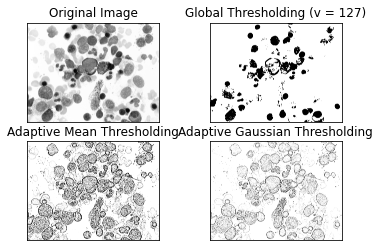

In [12]:
img = cv.imread('/content/drive/MyDrive/Thesis/PROF images/Aufnahme-161029-0017.jpg',0)
img = cv.medianBlur(img,5)
ret,th1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_MEAN_C,\
            cv.THRESH_BINARY,11,2)
th3 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv.THRESH_BINARY,11,2)
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]
for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

# Image comparison with brute force

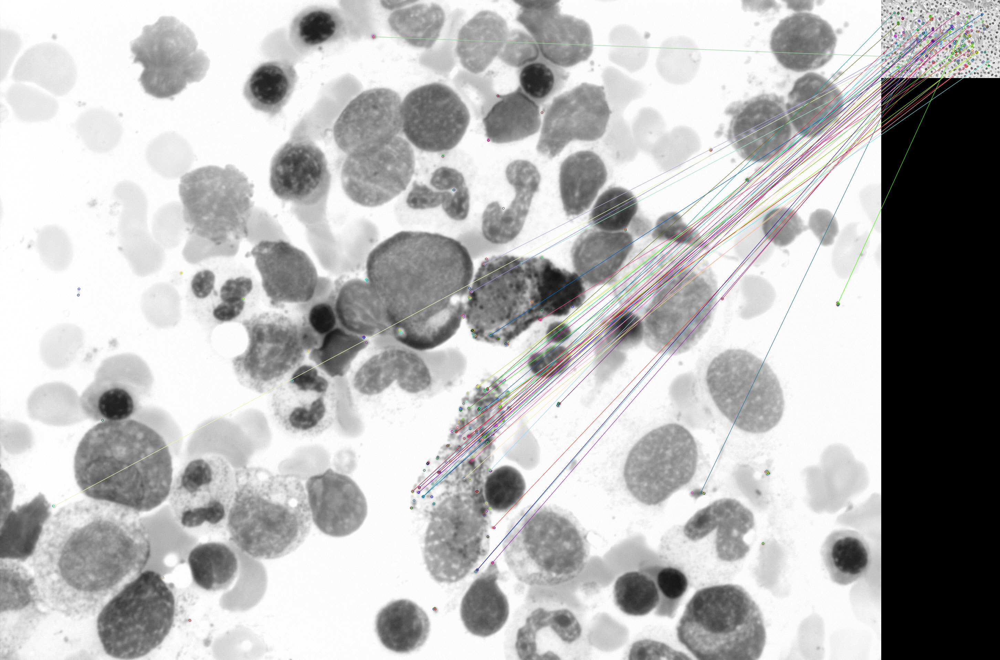

-1

In [16]:
img1 = cv.imread('/content/drive/MyDrive/Thesis/PROF images/Aufnahme-161029-0017.jpg', 0)
img2 = cv.imread('/content/drive/MyDrive/Thesis/PROF images/Normal mast cell images/00fd5462-0922-4e95-a455-1b0fc9835810.png', 0)

orb = cv.ORB_create(nfeatures=500)
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# matcher takes normType, which is set to cv2.NORM_L2 for SIFT and SURF, cv2.NORM_HAMMING for ORB, FAST and BRIEF
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)
# draw first 50 matches
match_img = cv.drawMatches(img1, kp1, img2, kp2, matches[:50], None)
cv2_imshow(match_img)
cv.waitKey()